In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from plotly import graph_objects as go

# Header

In [457]:
trades2 = pd.read_csv('round-5-island-data-bottle/trades_round_5_day_4.csv', sep=';')#.set_index(['symbol',"timestamp"]).sort_index()
# trades3 = pd.read_csv('round-5-island-data-bottle/trades_round_5_day_3.csv', sep=';')#.set_index(['symbol',"timestamp"]).sort_index()
# trades3.index =trades3.index + 1000000
# trades4 = pd.read_csv('round-5-island-data-bottle/trades_round_5_day_4.csv', sep=';')#.set_index(['symbol',"timestamp"]).sort_index()
# trades4.index =trades4.index + 2000000
prices2 = pd.read_csv('round-5-island-data-bottle/prices_round_5_day_4.csv', sep=';')#.set_index("timestamp")

# prices3 = pd.read_csv('round-5-island-data-bottle/prices_round_5_day_3.csv', sep=';')#.set_index("timestamp")
# prices3.index = prices3.index + 1000000
# prices4 = pd.read_csv('round-5-island-data-bottle/prices_round_5_day_4.csv', sep=';')#.set_index("timestamp")
# prices4.index = prices4.index + 2000000
trades = pd.concat([trades2,]).set_index(['symbol',"timestamp"]).sort_index()
prices = pd.concat([prices2,]).set_index("timestamp")

In [374]:
def get_position(name, symbol=None):
    buy = trades.pipe(lambda x: x[(x['buyer'] == name)])['quantity']
    sell = trades.pipe(lambda x: x[(x['seller'] == name)])['quantity']
    out = pd.concat([buy, - sell]).sort_index().groupby(level=[0,1]).sum().unstack().T.cumsum().reindex(prices.index.unique()).ffill()
    if symbol is not None:
        out = out[symbol]
    return out

In [375]:
def get_all_positions(symbol):

    buy = trades.loc[symbol].reset_index().groupby(['buyer','timestamp']).sum()['quantity']
    sell = trades.loc[symbol].reset_index().groupby(['seller','timestamp']).sum()['quantity']
    out = pd.concat([buy, - sell]).sort_index().groupby(level=[0,1]).sum().unstack().T.cumsum().reindex(prices.index.unique()).ffill()
    return out

In [376]:
def get_prices(symbol):
    return prices.pipe(lambda x: x[x['product'] == symbol])['mid_price']

In [377]:
trades['buyer'].value_counts()

buyer
Camilla     4670
Caesar      4251
Paris       3487
Charlie     3321
Penelope    1325
Pablo        700
Gary         267
Gina         153
Peter         71
Olivia         3
Name: count, dtype: int64

In [378]:
trades['seller'].value_counts()#.pipe(lambda x:  x[x == 'Peter'])

seller
Caesar      5990
Paris       4027
Charlie     2463
Camilla     2046
Pablo       1752
Penelope    1383
Gina         275
Gary         234
Peter         74
Olivia         4
Name: count, dtype: int64

In [379]:
trades['buyer'].pipe(lambda x:  x[x == 'Peter'])#.sort_index().plot(kind='bar', figsize=(15, 5), title='Number of trades per buyer')

symbol         timestamp
VOLCANIC_ROCK  9300         Peter
               10600        Peter
               13400        Peter
               36000        Peter
               42200        Peter
                            ...  
               938600       Peter
               944900       Peter
               976800       Peter
               981500       Peter
               986700       Peter
Name: buyer, Length: 71, dtype: object

In [380]:
trades.loc['KELP']['buyer'].value_counts()

buyer
Charlie     1210
Paris        841
Camilla      261
Penelope     175
Caesar       145
Pablo        108
Gary         103
Gina          55
Olivia         1
Name: count, dtype: int64

In [381]:
trades.loc['VOLCANIC_ROCK']['buyer'].value_counts()

buyer
Caesar    518
Peter      71
Pablo      55
Name: count, dtype: int64

In [382]:
trades.loc['VOLCANIC_ROCK']['seller'].value_counts()

seller
Caesar    508
Peter      74
Pablo      62
Name: count, dtype: int64

In [383]:
trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[(x['buyer'] == 'Peter')| (x['seller'] == 'Peter')])#.plot(figsize=(15, 5), title='Number of trades per buyer')
                                                                       #['quantity'].cumsum().plot()
# plt.plot(trades.loc['CROISSANTS'].pipe(lambda x: x[x['seller'] == 'Caesar'])['quantity'].cumsum().plot())

,buyer,seller,currency,price,quantity
timestamp,,,,,
3900,Caesar,Peter,SEASHELLS,10217.0,10
9300,Peter,Caesar,SEASHELLS,10226.0,10
9800,Caesar,Peter,SEASHELLS,10222.0,8
10400,Caesar,Peter,SEASHELLS,10219.0,10
10600,Peter,Caesar,SEASHELLS,10215.0,10
...,...,...,...,...,...
981500,Peter,Caesar,SEASHELLS,10194.0,6
982700,Caesar,Peter,SEASHELLS,10194.0,8
986700,Peter,Caesar,SEASHELLS,10194.0,8


In [384]:
fig = prices.pipe(lambda x: x[x['product'] == 'VOLCANIC_ROCK']['mid_price']).plot(backend='plotly')#.idxmin()
# for row in trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['buyer'] == 'Peter']).iterrows():

fig.add_scatter(x=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['buyer'] == 'Pablo']).index,
                 y=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['buyer'] == 'Pablo'])['price'],
                 mode='markers', name='Peter buys', line_color='green')
fig.add_scatter(x=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['seller'] == 'Pablo']).index,
                 y=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['seller'] == 'Pablo'])['price'],
                 mode='markers', name='Peter buys', line_color='red')


fig.add_scatter(x=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['buyer'] == 'Peter']).index,
                 y=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['buyer'] == 'Peter'])['price'],
                 mode='markers', name='Peter buys', line_color='yellow')
fig.add_scatter(x=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['seller'] == 'Peter']).index,
                 y=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['seller'] == 'Peter'])['price'],
                 mode='markers', name='Peter buys', line_color='orange')

# fig.add_scatter(x=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[(x['buyer'] == 'Caesar') & (x['seller'] == 'Caesar')]).index,
#                  y=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[(x['buyer'] == 'Caesar') & (x['seller'] == 'Caesar')])['price'],
#                  marker_size=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[(x['buyer'] == 'Caesar') & (x['seller'] == 'Caesar')])['quantity'],
#                     mode='markers', name='CC', line_color='black')

# fig.add_scatter(x=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[(x['buyer'] == 'Peter') & (x['seller'] == 'Caesar')]).index,
#                  y=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[(x['buyer'] == 'Peter') & (x['seller'] == 'Caesar')])['price'],
#                  marker_size=trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[(x['buyer'] == 'Peter') & (x['seller'] == 'Caesar')])['quantity'],
#                     mode='markers', name='CC', line_color='black')



# fig.update_traces(marker=dict(size=9))

# for row in trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['seller'] == 'Peter']).iterrows():
#     fig.add_vline(x=row[0], line_color='red', line_width=1, line_dash='dash')

fig

<Axes: xlabel='timestamp'>

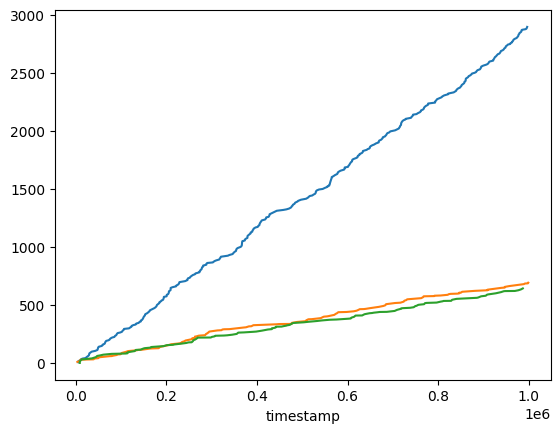

In [385]:
trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[(x['buyer'] == 'Caesar') & (x['seller'] == 'Caesar')])['quantity'].cumsum().plot()
trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[(x['buyer'] == 'Caesar') & (x['seller'] != 'Caesar')])['quantity'].cumsum().plot()
trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[(x['seller'] == 'Caesar')& (x['buyer'] != 'Caesar')])['quantity'].cumsum().plot()

In [444]:
transac_df = trades.reset_index().groupby(['buyer','seller']).count()['timestamp'].unstack()#.value_counts()#.pipe(lambda x: x[x['buyer'] == 'Gina'])
transac_df  = pd.concat([transac_df , transac_df.sum(axis=0).rename('SELL Total').to_frame().T], axis=0)
transac_df ['Total'] = transac_df .sum(axis=1)

transac_df 

seller,Caesar,Camilla,Charlie,Gary,Gina,Olga,Olivia,Pablo,Paris,Penelope,Peter,Total
Caesar,1247.0,677.0,NaN,13.0,24.0,NaN,1.0,360.0,1583.0,299.0,73.0,4277.0
Camilla,2373.0,82.0,NaN,25.0,36.0,NaN,NaN,939.0,350.0,531.0,NaN,4336.0
Charlie,179.0,26.0,NaN,206.0,157.0,NaN,2.0,605.0,1924.0,402.0,NaN,3501.0
Gary,13.0,32.0,169.0,NaN,4.0,1.0,NaN,6.0,7.0,NaN,NaN,232.0
Gina,12.0,27.0,42.0,3.0,NaN,NaN,NaN,9.0,17.0,8.0,NaN,118.0
Olivia,1.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0
Pablo,218.0,188.0,242.0,6.0,13.0,NaN,NaN,5.0,83.0,9.0,NaN,764.0
Paris,1355.0,418.0,1474.0,22.0,22.0,NaN,NaN,76.0,67.0,22.0,NaN,3456.0
Penelope,243.0,491.0,364.0,NaN,6.0,NaN,NaN,2.0,17.0,NaN,NaN,1123.0
Peter,61.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,61.0


In [445]:
trades.reset_index().groupby(['symbol', 'seller',]).count()['timestamp'].unstack()

seller,Caesar,Camilla,Charlie,Gary,Gina,Olga,Olivia,Pablo,Paris,Penelope,Peter
symbol,,,,,,,,,,,
CROISSANTS,341.0,225.0,NaN,NaN,NaN,NaN,1.0,NaN,378.0,NaN,NaN
DJEMBES,481.0,107.0,NaN,NaN,NaN,NaN,NaN,NaN,450.0,NaN,NaN
JAMS,400.0,332.0,NaN,NaN,NaN,NaN,NaN,NaN,436.0,NaN,NaN
KELP,169.0,289.0,702.0,102.0,95.0,1.0,1.0,284.0,1095.0,173.0,NaN
MAGNIFICENT_MACARONS,12.0,95.0,120.0,NaN,NaN,NaN,NaN,NaN,136.0,NaN,NaN
PICNIC_BASKET1,134.0,100.0,5.0,NaN,NaN,NaN,NaN,196.0,NaN,119.0,NaN
PICNIC_BASKET2,112.0,93.0,34.0,NaN,NaN,NaN,NaN,168.0,NaN,119.0,NaN
RAINFOREST_RESIN,73.0,50.0,756.0,69.0,75.0,NaN,NaN,235.0,454.0,152.0,NaN
SQUID_INK,173.0,318.0,676.0,104.0,92.0,NaN,1.0,278.0,1099.0,173.0,NaN


In [388]:
trades.pipe(lambda x: x[(x['buyer'] == 'Pablo')]).index.get_level_values(0).unique()#['quantity'].swaplevel(0, 1).sort_index(axis=0,level=0).groupby(level=[0,1]).sum().to_clipboard()

Index(['KELP', 'PICNIC_BASKET1', 'PICNIC_BASKET2', 'RAINFOREST_RESIN',
       'SQUID_INK', 'VOLCANIC_ROCK', 'VOLCANIC_ROCK_VOUCHER_10000',
       'VOLCANIC_ROCK_VOUCHER_10250', 'VOLCANIC_ROCK_VOUCHER_10500',
       'VOLCANIC_ROCK_VOUCHER_9500', 'VOLCANIC_ROCK_VOUCHER_9750'],
      dtype='object', name='symbol')

# SQUID

In [389]:
trades.index.get_level_values(0).unique()

Index(['CROISSANTS', 'DJEMBES', 'JAMS', 'KELP', 'MAGNIFICENT_MACARONS',
       'PICNIC_BASKET1', 'PICNIC_BASKET2', 'RAINFOREST_RESIN', 'SQUID_INK',
       'VOLCANIC_ROCK', 'VOLCANIC_ROCK_VOUCHER_10000',
       'VOLCANIC_ROCK_VOUCHER_10250', 'VOLCANIC_ROCK_VOUCHER_10500',
       'VOLCANIC_ROCK_VOUCHER_9500', 'VOLCANIC_ROCK_VOUCHER_9750'],
      dtype='object', name='symbol')

In [390]:
transac_df = trades.loc[['PICNIC_BASKET2']].reset_index().groupby(['buyer','seller']).count()['timestamp'].unstack()#.value_counts()#.pipe(lambda x: x[x['buyer'] == 'Gina'])
transac_df  = pd.concat([transac_df , transac_df.sum(axis=0).rename('Total').to_frame().T], axis=0)
transac_df ['Total'] = transac_df .sum(axis=1)

transac_df 

seller,Caesar,Camilla,Charlie,Pablo,Penelope,Total
Caesar,NaN,NaN,NaN,48.0,52.0,100.0
Camilla,38.0,NaN,NaN,77.0,61.0,176.0
Charlie,NaN,NaN,NaN,57.0,31.0,88.0
Pablo,23.0,41.0,NaN,NaN,1.0,65.0
Penelope,43.0,49.0,39.0,NaN,NaN,131.0
Total,104.0,90.0,39.0,182.0,145.0,560.0


In [391]:
transac_df = trades.loc[['PICNIC_BASKET1','PICNIC_BASKET1']].reset_index().groupby(['buyer','seller']).count()['timestamp'].unstack()#.value_counts()#.pipe(lambda x: x[x['buyer'] == 'Gina'])
transac_df  = pd.concat([transac_df , transac_df.sum(axis=0).rename('Total').to_frame().T], axis=0)
transac_df ['Total'] = transac_df .sum(axis=1)

transac_df 

seller,Caesar,Camilla,Charlie,Pablo,Penelope,Total
Caesar,NaN,NaN,NaN,204.0,180.0,384.0
Camilla,18.0,NaN,NaN,230.0,92.0,340.0
Charlie,NaN,NaN,NaN,NaN,14.0,14.0
Pablo,106.0,114.0,NaN,NaN,2.0,222.0
Penelope,156.0,98.0,8.0,NaN,NaN,262.0
Total,280.0,212.0,8.0,434.0,288.0,1222.0


In [392]:
trades_df = trades.loc['PICNIC_BASKET1']
B = 'Pablo'
S = ''

if B:
    df = trades_df.pipe(lambda x: x[(x['buyer'] == B)])
    df_inv = trades_df.pipe(lambda x: x[(x['seller'] == B)])
if S:
    df = df.pipe(lambda x: x[(x['seller'] == S)])
    df_inv = df_inv.pipe(lambda x: x[(x['buyer'] == S)])

# df_inv = trades.loc['SQUID_INK'].pipe(lambda x: x[(x['buyer'] == S) & (x['seller'] == B)])
fig = prices.pipe(lambda x: x[x['product'] == 'PICNIC_BASKET1']['mid_price']).plot(backend='plotly')#.idxmin()
# for row in trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['buyer'] == 'Peter']).iterrows():
# df = df.groupby(df.index).last()
# df_inv = df_inv.groupby(df_inv.index).last()
fig.add_scatter(x=df.index,
                 y=df['price'],
                 mode='markers', line_color='green', text=df[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name=B + ' buys')
fig.add_scatter(x=df_inv.index,
                 y=df_inv['price'],
                 mode='markers', line_color='red', text=df_inv[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name=B + ' sells')
fig.update_traces(marker=dict(size=8))


In [393]:
trades_df = trades.loc['PICNIC_BASKET2']
B = 'Pablo'
S = ''
if B:
    df = trades_df.pipe(lambda x: x[(x['buyer'] == B)])
    df_inv = trades_df.pipe(lambda x: x[(x['seller'] == B)])
if S:
    df = df.pipe(lambda x: x[(x['seller'] == S)])
    df_inv = df_inv.pipe(lambda x: x[(x['buyer'] == S)])

# df_inv = trades.loc['SQUID_INK'].pipe(lambda x: x[(x['buyer'] == S) & (x['seller'] == B)])
fig = prices.pipe(lambda x: x[x['product'] == 'PICNIC_BASKET2']['mid_price']).plot(backend='plotly')#.idxmin()
# for row in trades.loc['VOLCANIC_ROCK'].pipe(lambda x: x[x['buyer'] == 'Peter']).iterrows():

fig.add_scatter(x=df.index,
                 y=df['price'],
                 mode='markers', line_color='green', text=df[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name=B + ' buys')
fig.add_scatter(x=df_inv.index,
                 y=df_inv['price'],
                 mode='markers', line_color='red', text=df_inv[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name=B + ' sells')
fig.update_traces(marker=dict(size=8))

In [394]:
from plotly.subplots import make_subplots

In [395]:
trades_df1 = trades.loc['PICNIC_BASKET1']
trades_df2 = trades.loc['PICNIC_BASKET2']
B = 'Pablo'
prices1 = prices.pipe(lambda x: x[x['product'] == 'PICNIC_BASKET1']['mid_price'])
prices2 = prices.pipe(lambda x: x[x['product'] == 'PICNIC_BASKET2']['mid_price'])
djembes = prices.pipe(lambda x: x[x['product'] == 'DJEMBES']['mid_price'])

df1 = trades_df1.pipe(lambda x: x[(x['buyer'] == B)])
df_inv1 = trades_df1.pipe(lambda x: x[(x['seller'] == B)])
df2 = trades_df2.pipe(lambda x: x[(x['buyer'] == B)])
df_inv2 = trades_df2.pipe(lambda x: x[(x['seller'] == B)])

filter = df1.index.unique().difference(df2.index.unique())
filter_inv = df_inv1.index.unique().difference(df_inv2.index.unique())

filter2 = df2.index.unique().difference(df1.index.unique())
filter_inv2 = df_inv2.index.unique().difference(df_inv1.index.unique())

fig = make_subplots(specs=([[{"secondary_y": True}]]))
# fig.add_trace(go.Scatter(x=prices1.index,
#                          y=prices1,
#                          mode='lines',
#                          name='PICNIC_BASKET1'),
#               secondary_y=False)
# fig.add_trace(go.Scatter(x=prices2.index,
#                          y=prices2,
#                          mode='lines',
#                          name='PICNIC_BASKET2'),
#               secondary_y=True)
fig.add_trace(go.Scatter(x=prices1.index,
                         y=prices1,
                         mode='lines',
                         name='PICNIC_BASKET1 - PICNIC_BASKET2'),
              secondary_y=False)
fig.add_trace(go.Scatter(x=prices2.index,
                         y=prices2,
                         mode='lines',
                         name='PICNIC_BASKET1 - PICNIC_BASKET2'),
              secondary_y=True)

fig.add_trace(go.Scatter(x=df1.loc[filter].index,
                         y=df1.loc[filter]['price'],
                         mode='markers', line_color='green', text=df1[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name=B + ' buys'),
              secondary_y=False)
fig.add_trace(go.Scatter(x=df_inv1.loc[filter_inv].index,
                         y=df_inv1.loc[filter_inv]['price'],
                         mode='markers', line_color='red', text=df_inv1[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name=B + ' sells'),
                secondary_y=False)
fig.add_trace(go.Scatter(x=df2.loc[filter2].index,
                         y=df2.loc[filter2]['price'],
                         mode='markers', line_color='limegreen', text=df2[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name=B + ' buys'),
              secondary_y=True)
fig.add_trace(go.Scatter(x=df_inv2.loc[filter_inv2].index,
                         y=df_inv2.loc[filter_inv2]['price'],
                         mode='markers', line_color='coral', text=df_inv2[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name=B + ' sells'),
                secondary_y=True)
# fig.add_trace(go.Scatter(x=df2.index,
#                          y=df2['price'],
#                          mode='markers', line_color='limegreen', text=df2[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name=B + ' buys'),
#               secondary_y=True)      
# fig.add_trace(go.Scatter(x=df_inv2.index,
#                          y=df_inv2['price'],
#                          mode='markers', line_color='coral', text=df_inv2[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name=B + ' sells'),
#                 secondary_y=True)                  



# Position

In [396]:
B = 'Pablo'
symbol = 'VOLCANIC_ROCK'

pos1 = get_position(B, symbol)
B = 'Peter'
pos2 = get_position(B, symbol)

B = 'Caesar'
pos3 = get_position(B, symbol)

fig = make_subplots(specs=([[{"secondary_y": True}]]))
fig.add_trace(go.Scatter(x=prices.pipe(lambda x: x[x['product'] == symbol]['mid_price']).index,
                         y=prices.pipe(lambda x: x[x['product'] == symbol]['mid_price']),
                         mode='lines',
                         name=symbol),
              secondary_y=False)
fig.add_trace(go.Scatter(x=pos1.index,
                         y=pos1,
                         mode='lines',
                         name='Pablo'),
              secondary_y=True)
fig.add_trace(go.Scatter(x=pos2.index,
                         y=pos2,
                         mode='lines',
                         name='Peter'),
              secondary_y=True)
fig.add_trace(go.Scatter(x=pos3.index,
                         y=pos3,
                         mode='lines',
                         name='Caesar'),
              secondary_y=True)
fig.add_trace(go.Scatter(x=pos3.index,
                         y=pos3-pos2,
                         mode='lines',
                         name='Caesar - Peter'),
              secondary_y=True)


In [397]:
p = get_position('Penelope')
p.plot(backend='plotly')

In [398]:
symbol = 'VOLCANIC_ROCK_VOUCHER_10500'

p = get_prices(symbol)
pos = get_all_positions(symbol)
vol = np.log(p).diff().rolling(100).std()
fig = make_subplots(specs=([[{"secondary_y": True}]]))
fig.add_trace(go.Scatter(x=p.index,
                         y=p,
                         mode='lines',
                         name=symbol),
              secondary_y=False)
for name in pos.columns:
    fig.add_trace(go.Scatter(x=pos.index,
                             y=pos[name],
                             mode='lines',
                             name=name),
                  secondary_y=True)
# fig.add_trace(go.Scatter(x=pos.index,
#                             y=(pos['Caesar'] + pos['Camilla']),
#                             mode='lines',
#                             name=name),
#                 secondary_y=True)
fig


In [399]:
t =trades.loc['JAMS'].pipe(lambda x:x[x['buyer'] == 'Camilla']).index
trades.loc[trades.index.get_level_values(1).isin(t)]

buyer    seller   currency    price  quantity
symbol           timestamp                                                 
CROISSANTS       109400      Caesar     Paris  SEASHELLS   4265.0         6
                 202000       Paris    Caesar  SEASHELLS   4279.0         5
                 652600       Paris    Caesar  SEASHELLS   4250.0         7
                 710800      Caesar     Paris  SEASHELLS   4246.0         5
DJEMBES          469500      Caesar     Paris  SEASHELLS  13344.0         4
                 629600       Paris    Caesar  SEASHELLS  13282.0         2
JAMS             109400     Camilla     Paris  SEASHELLS   6545.0         9
                 202000     Camilla     Paris  SEASHELLS   6505.0         5
                 469500     Camilla     Paris  SEASHELLS   6474.0         6
                 629600     Camilla     Paris  SEASHELLS   6508.0         8
                 652600     Camilla     Paris  SEASHELLS   6504.0         3
                 710800     Camilla     Paris  SEASHELLS   6520.0         4
                 986900     Camilla     Paris  SEASHELLS   6528.0         7
KELP             109400        Gina   Camilla  SEASHELLS   2051.0         6
                 109400        Gina   Charlie  SEASHELLS   2051.0         2
PICNIC_BASKET1   202000      Caesar     Pablo  SEASHELLS  58715.0         1
                 202000     Camilla     Pablo  SEASHELLS  58714.0         5
PICNIC_BASKET2   202000     Camilla     Pablo  SEASHELLS  30132.0         6
RAINFOREST_RESIN 469500     Charlie  Penelope  SEASHELLS   9992.0         6
                 469500     Charlie     Pablo  SEASHELLS   9998.0         4
                 652600       Paris   Charlie  SEASHELLS  10008.0         1
SQUID_INK        109400        Gina   Camilla  SEASHELLS   1797.0         6
                 109400        Gina   Charlie  SEASHELLS   1797.0         2
                 652600       Paris   Charlie  SEASHELLS   1797.0         1

In [464]:
symbol = 'VOLCANIC_ROCK'


p = get_prices(symbol)
pos = get_all_positions(symbol)
fig = make_subplots(specs=([[{"secondary_y": True}]]))
fig.add_trace(go.Scatter(x=p.index,
                         y=p,
                         mode='lines',
                         name=symbol),
              secondary_y=False)
for name in pos.columns:
    fig.add_trace(go.Scatter(x=pos.index,
                             y=pos[name],
                             mode='lines',
                             name=name),
                  secondary_y=True)
extra = trades.loc['VOLCANIC_ROCK'].pipe(lambda x:x[x['buyer'] == 'Pablo'])
fig.add_trace(go.Scatter(x=extra.index,
                         y=extra['price'],
                         mode='markers', line_color='green', text=extra[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name='Camilla buys'),
              secondary_y=False)


In [468]:
symbol = 'MAGNIFICENT_MACARONS'


p = get_prices(symbol)
pos = get_all_positions(symbol)
fig = make_subplots(specs=([[{"secondary_y": True}]]))
fig.add_trace(go.Scatter(x=p.index,
                         y=p,
                         mode='lines',
                         name=symbol),
              secondary_y=False)
for name in pos.columns:
    fig.add_trace(go.Scatter(x=pos.index,
                             y=pos[name],
                             mode='lines',
                             name=name),
                  secondary_y=True)
# extra = trades.loc['VOLCANIC_ROCK'].pipe(lambda x:x[x['buyer'] == 'Peter'])
fig.add_trace(go.Scatter(x=extra.index,
                         y=extra['price'],
                         mode='markers', line_color='green', text=extra[['buyer','seller']].pipe(lambda x: x['buyer'] + ' - ' + x['seller']), name='Camilla buys'),
              secondary_y=False)


In [461]:
get_position('Pablo').plot(backend='plotly')


In [453]:
p = get_prices('PICNIC_BASKET1').rename("PICNIC_BASKET1")#.pipe(lambda x: x.div(x.iloc[0]))
c = get_prices('PICNIC_BASKET2').rename("PICNIC_BASKET2")#.pipe(lambda x: x.div(x.iloc[0]))
cr = get_prices('CROISSANTS').rename("CROISSANTS")#.pipe(lambda x: x.div(x.iloc[0]))
spread = (get_prices('PICNIC_BASKET1') - 4*get_prices('JAMS') - get_prices('DJEMBES')).rename("PICNIC_BASKET1 -DJEMBES")#.pipe(lambda x: x.div(x.iloc[0]))
dj = get_prices('DJEMBES').rename("DJEMBES")#.pipe(lambda x: x.div(x.iloc[0]))
p = pd.concat([p, cr, c,spread], axis=1).pipe(lambda x: x.div(x.iloc[0]))
p.plot(backend='plotly')

In [466]:
symbol = 'MAGNIFICENT_MACARONS'
get_all_positions(symbol).mul((get_prices(symbol) - get_prices(symbol).shift(1)), axis=0).cumsum().plot(backend='plotly')

In [465]:
symbol = 'MAGNIFICENT_MACARONS'
get_all_positions(symbol).mul((get_prices(symbol) - get_prices(symbol).shift(1)), axis=0).cumsum().plot(backend='plotly')

In [405]:
p = get_prices('PICNIC_BASKET1').rename("PICNIC_BASKET1").pipe(lambda x: x.div(x.iloc[0]))
c = get_prices('PICNIC_BASKET2').rename("PICNIC_BASKET2").pipe(lambda x: x.div(x.iloc[0]))
dj = get_prices('DJEMBES').rename("DJEMBES").pipe(lambda x: x.div(x.iloc[0]))
cr = get_prices('CROISSANTS').rename("CROISSANTS").pipe(lambda x: x.div(x.iloc[0]))
jams = get_prices('JAMS').rename("JAMS").pipe(lambda x: x.div(x.iloc[0]))
squid = get_prices('SQUID_INK').rename("SQUID_INK").pipe(lambda x: x.div(x.iloc[0]))
kelp = get_prices('KELP').rename("KELP").pipe(lambda x: x.div(x.iloc[0]))
rock = get_prices('VOLCANIC_ROCK').rename("VOLCANIC_ROCK").pipe(lambda x: x.div(x.iloc[0]))
maca = get_prices('MAGNIFICENT_MACARONS').rename("MACA").pipe(lambda x: x.div(x.iloc[0]))
p = pd.concat([p, c, cr, dj, jams, squid, kelp, rock, maca], axis=1)
p.pct_change().corr()

,PICNIC_BASKET1,PICNIC_BASKET2,CROISSANTS,DJEMBES,JAMS,SQUID_INK,KELP,VOLCANIC_ROCK,MACA
PICNIC_BASKET1,1.000000,0.419830,0.337707,0.186982,0.288338,-0.012609,-0.001680,0.014451,0.020755
PICNIC_BASKET2,0.419830,1.000000,0.393984,-0.013093,0.309843,-0.007111,0.001672,-0.000361,0.021611
CROISSANTS,0.337707,0.393984,1.000000,0.001986,0.001341,0.015776,0.016471,-0.008267,0.012446
DJEMBES,0.186982,-0.013093,0.001986,1.000000,-0.022845,-0.009764,-0.011294,0.014051,0.012221
JAMS,0.288338,0.309843,0.001341,-0.022845,1.000000,-0.013876,0.014659,0.007578,-0.002961
SQUID_INK,-0.012609,-0.007111,0.015776,-0.009764,-0.013876,1.000000,0.289076,0.010708,-0.003412
KELP,-0.001680,0.001672,0.016471,-0.011294,0.014659,0.289076,1.000000,0.008125,-0.010427
VOLCANIC_ROCK,0.014451,-0.000361,-0.008267,0.014051,0.007578,0.010708,0.008125,1.000000,0.006523
MACA,0.020755,0.021611,0.012446,0.012221,-0.002961,-0.003412,-0.010427,0.006523,1.000000
